In [ ]:
%pip install yfinance
%pip install numpy==1.22

Python interpreter will be restarted.
  Attempting uninstall: pytz
    Found existing installation: pytz 2021.3
    Not uninstalling pytz at /databricks/python3/lib/python3.9/site-packages, outside environment /local_disk0/.ephemeral_nfs/envs/pythonEnv-625d621b-6e14-4a3c-8629-c2d34a04e9be
    Can't uninstall 'pytz'. No files were found to uninstall.
Python interpreter will be restarted.
Python interpreter will be restarted.
  Attempting uninstall: numpy
    Found existing installation: numpy 1.21.5
    Not uninstalling numpy at /databricks/python3/lib/python3.9/site-packages, outside environment /local_disk0/.ephemeral_nfs/envs/pythonEnv-625d621b-6e14-4a3c-8629-c2d34a04e9be
    Can't uninstall 'numpy'. No files were found to uninstall.
Python interpreter will be restarted.


In [ ]:
import datetime
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator
from matplotlib.pyplot import figure
import numpy as np
import yfinance as yf
from random import random
from scipy.stats import norm

# Functions for MC simulations: Crude and FX

In [ ]:
def exp_power(power, range_start, range_end):
  '''
  integer-power, integer-range_start, integer-range_end inputs
  create a numpy array of values of 10 raised to the power of values within range_start and range_end range
  x-numpy array output
  ''' 
  x = [power ** n for n in range(range_start, range_end)]
  x = np.array(x)
  return x




def data_generation(ticker, days_diff_from_today):
  '''
  ticker-string, days_diff_from_today-integer inputs
  create the dataset, estimate its statistics (of daily returns) as well as the initial price
  data-dataframe, mean_return-float, std_return-float, initial_price-float outputs
  '''
  end_date = str(datetime.date.today())
  start_date = str(datetime.date.today() - datetime.timedelta(days=days_diff_from_today))
  data = yf.download(ticker, start=start_date, end=end_date)
  data['Returns'] = data['Adj Close'].pct_change()
  mean_return = data['Returns'].mean()
  std_return = data['Returns'].std()
  initial_price = data['Adj Close'][-1]
  print(f'The mean daily returns for {ticker} are {mean_return}')
  print(f'The standard deviation of daily returns for {ticker} are {std_return}')
  return data, mean_return, std_return, initial_price




def mc_simulations(simulations, days_simulated, ticker, days_diff_from_today):
  '''
  simulations-numpyarray, days_simulated-integer, ticker-string, days_diff_from_today-integer inputs
  simulate for a range of simulation numbers the relevant closing prices and plot the results
  plot_list-list of tuples output
  '''
  plot_list = []
  data_gen, mean_return_gen, std_return_gen, initial_price_gen = data_generation(ticker, days_diff_from_today)
  check_trade_days(data_gen)
  for num_simulations in simulations:
    simulated_prices = np.zeros([num_simulations, days_simulated])
    for i in range(num_simulations):
      daily_returns = np.random.normal(mean_return_gen, std_return_gen, days_simulated)
      simulated_prices[i, 0] = initial_price_gen
      for j in range(1, days_simulated):
        simulated_prices[i, j] = simulated_prices[i, j-1] * (1 + daily_returns[j])
    plot_list.append([num_simulations, simulated_prices]) 
  fig, axes = plt.subplots(nrows = len(plot_list), ncols = 1, constrained_layout = True, figsize=(20,20), facecolor="0.85")
  fig.suptitle(f'MC simulations of {ticker} prices')
  axes_list = []
  for i, ax in enumerate(fig.axes):
    axes_list.append(ax)
  zipped = zip(plot_list, axes_list)
  for counter, tupled in enumerate(list(zipped)):
    for k in range(tupled[0][0]):
      tupled[1].plot(tupled[0][1][k,:], linewidth = 0.5)
      tupled[1].set_xlabel('Days')
      tupled[1].set_ylabel('Simulated crude oil prices')
      tupled[1].set_title(f'Monte Carlo simulation of {ticker} prices for {tupled[0][0]} simulations')

  plt.show()        
  return plot_list




def check_trade_days(data):
  '''
  data-dataframe input
  check the average trading days in a year from given dataset
  None output
  '''
  df = pd.DataFrame(pd.DatetimeIndex(data.index).year)
  df_date = pd.DataFrame(df['Date'].value_counts())
  avg_trading_days = df_date['Date'][df_date['Date'] >= 100].sum()/len(df_date.index[df_date['Date'] >= 100])
  print(f'Average trading days are {avg_trading_days} therefore use a value of 252 as annual trading days')



  
def percentile_plot(plot_list, ticker):
  '''
  plot_list-list of tuples, ticker-string inputs
  plot the prices for different percentile values using different statistical distributions
  None output
  '''
  fig, axes = plt.subplots(nrows = len(plot_list), ncols = 1, constrained_layout = True, figsize=(20,20), facecolor="0.85")
  fig.suptitle(f'MC simulations/percentile values of {ticker} prices')
  axes_list = []
  for i, ax in enumerate(fig.axes):
    axes_list.append(ax)
  zipped = zip(plot_list, axes_list)
  p = np.linspace(0, 100, 6001)
  lines = [
      ('linear', '-', 'C0'),
      ('inverted_cdf', ':', 'C1'),
      ('averaged_inverted_cdf', '-.', 'C1'),
      ('closest_observation', ':', 'C2'),
      ('interpolated_inverted_cdf', '--', 'C1'),
      ('hazen', '--', 'C3'),
      ('weibull', '-.', 'C4'),
      ('median_unbiased', '--', 'C5'),
      ('normal_unbiased', '-.', 'C6'),
      ]
  for counter, tupled in enumerate(list(zipped)):
    for method, style, color in lines:
      tupled[1].plot(p, np.percentile(tupled[0][1][:, -1], p, method = method), label = method, linestyle = style, color = color)
      tupled[1].set(
      title=f'Percentiles for different methods and data on simulated {ticker} prices: ' + str(tupled[0][0]) + ' simulations',
      xlabel='Percentile',
      ylabel='Estimated percentile value',
      yticks=tupled[0][1][:, -1])
      tupled[1].yaxis.set_major_locator(MaxNLocator(20)) 
      tupled[1].legend()
  plt.show()

## Crude oil price change: simulations

In [ ]:
base = 10
start_range = 0
end_range = 3

array_sims = exp_power(base, start_range, end_range)

[*********************100%***********************]  1 of 1 completed
The mean daily returns for CL=F are -0.0001487292575684389
The standard deviation of daily returns for CL=F are 0.05129626644489508
Average trading days are 251.1818181818182 therefore use a value of 252 as annual trading days


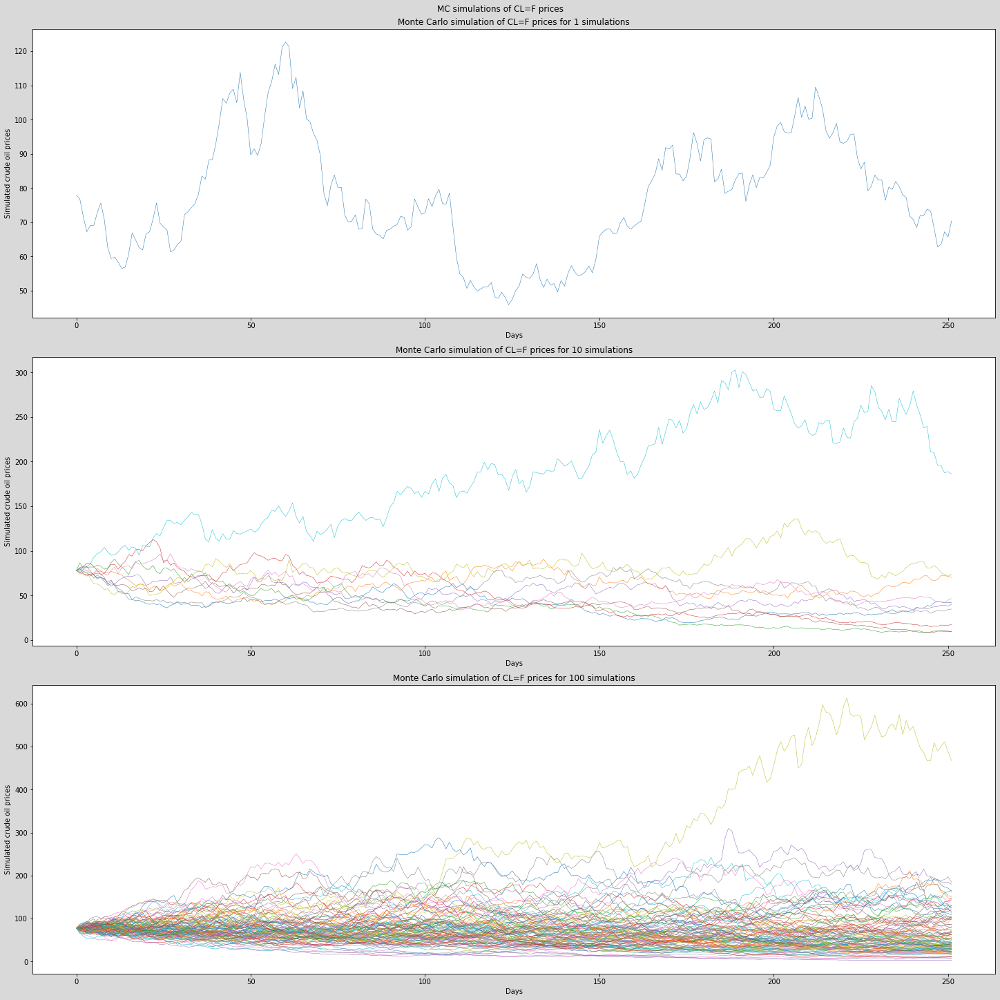

<Figure size 432x288 with 0 Axes>

In [ ]:
days_simulated = 252
ticker = "CL=F"
days_diff_from_today = 10000

sim_output_crude = mc_simulations(simulations = array_sims, days_simulated = days_simulated, ticker = ticker, days_diff_from_today = days_diff_from_today)

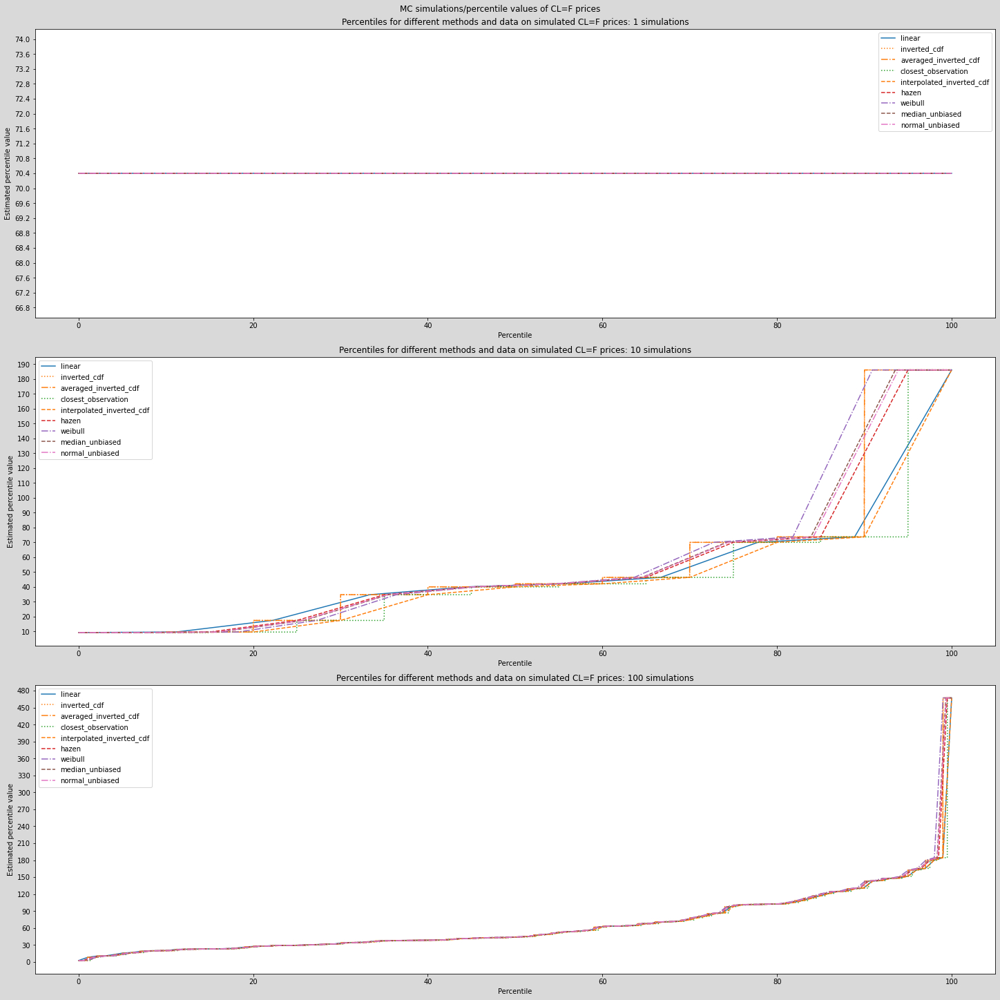

In [ ]:
percentile_plot(sim_output_crude,ticker = ticker)

## FX rate changes: simulations

[*********************100%***********************]  1 of 1 completed
The mean daily returns for USDEUR=X are 4.3149649199432916e-05
The standard deviation of daily returns for USDEUR=X are 0.0072498588564134615
Average trading days are 259.36842105263156 therefore use a value of 252 as annual trading days


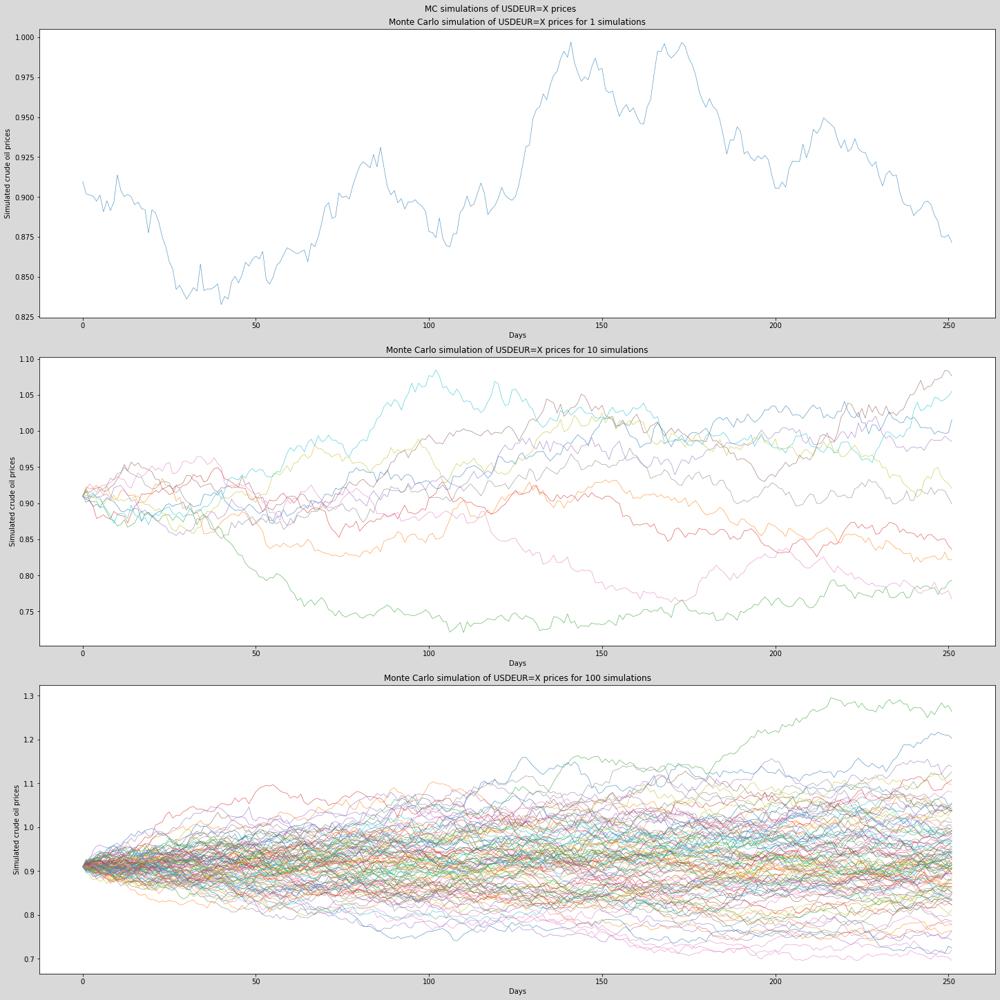

In [ ]:
days_simulated = 252
ticker = "USDEUR=X"
days_diff_from_today = 10000

sim_output_usdeur = mc_simulations(simulations = array_sims, days_simulated = days_simulated, ticker = ticker, days_diff_from_today = days_diff_from_today)

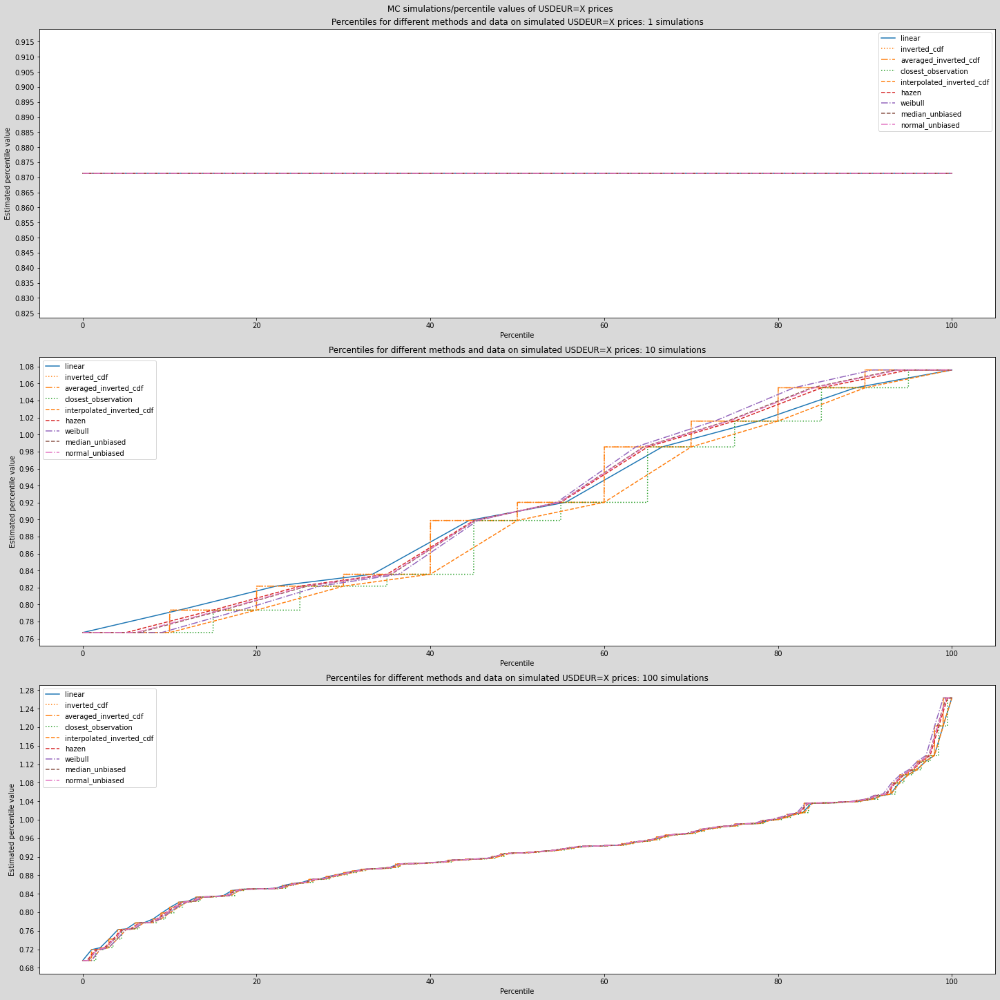

In [ ]:
percentile_plot(sim_output_usdeur,ticker = ticker)

[*********************100%***********************]  1 of 1 completed
The mean daily returns for USDGBP=X are 8.233811633429987e-05
The standard deviation of daily returns for USDGBP=X are 0.006058474350324226
Average trading days are 260.0 therefore use a value of 252 as annual trading days


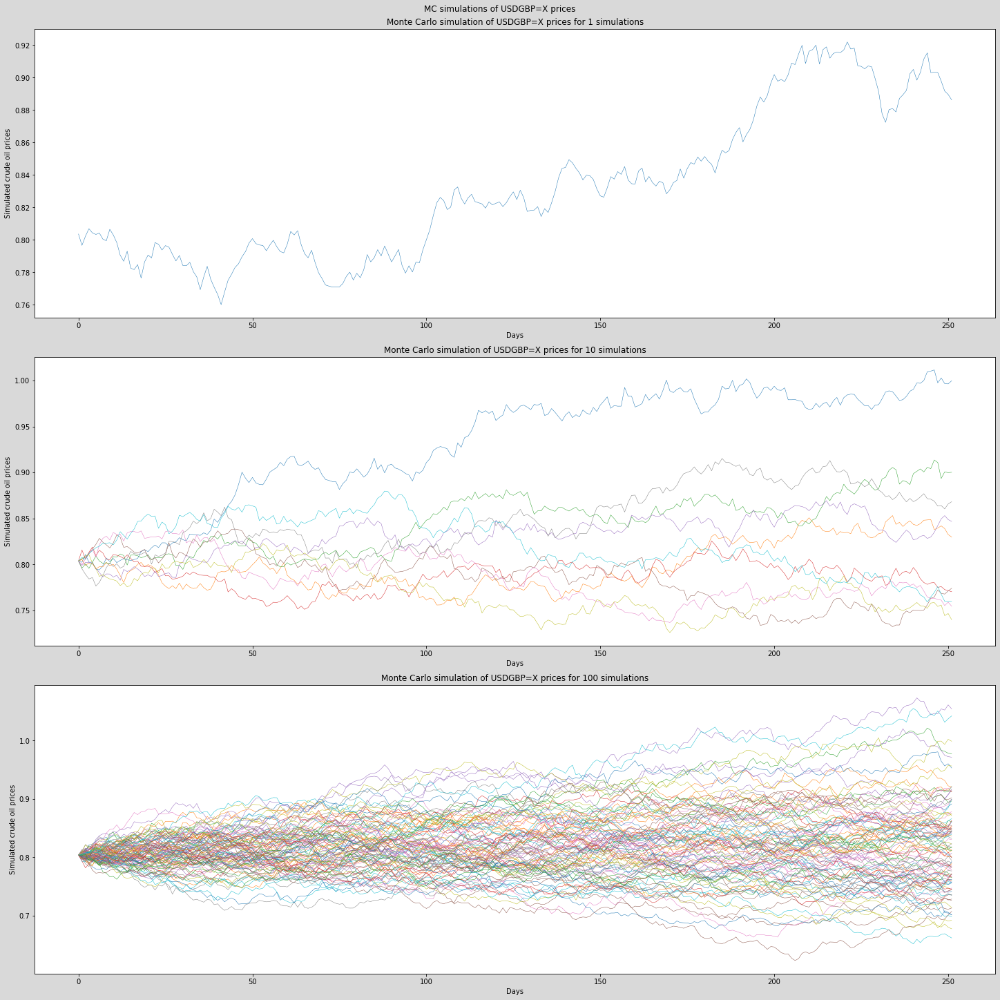

In [ ]:
days_simulated = 252
ticker = "USDGBP=X"
days_diff_from_today = 10000

sim_output_usdgbp = mc_simulations(simulations = array_sims, days_simulated = days_simulated, ticker = ticker, days_diff_from_today = days_diff_from_today)

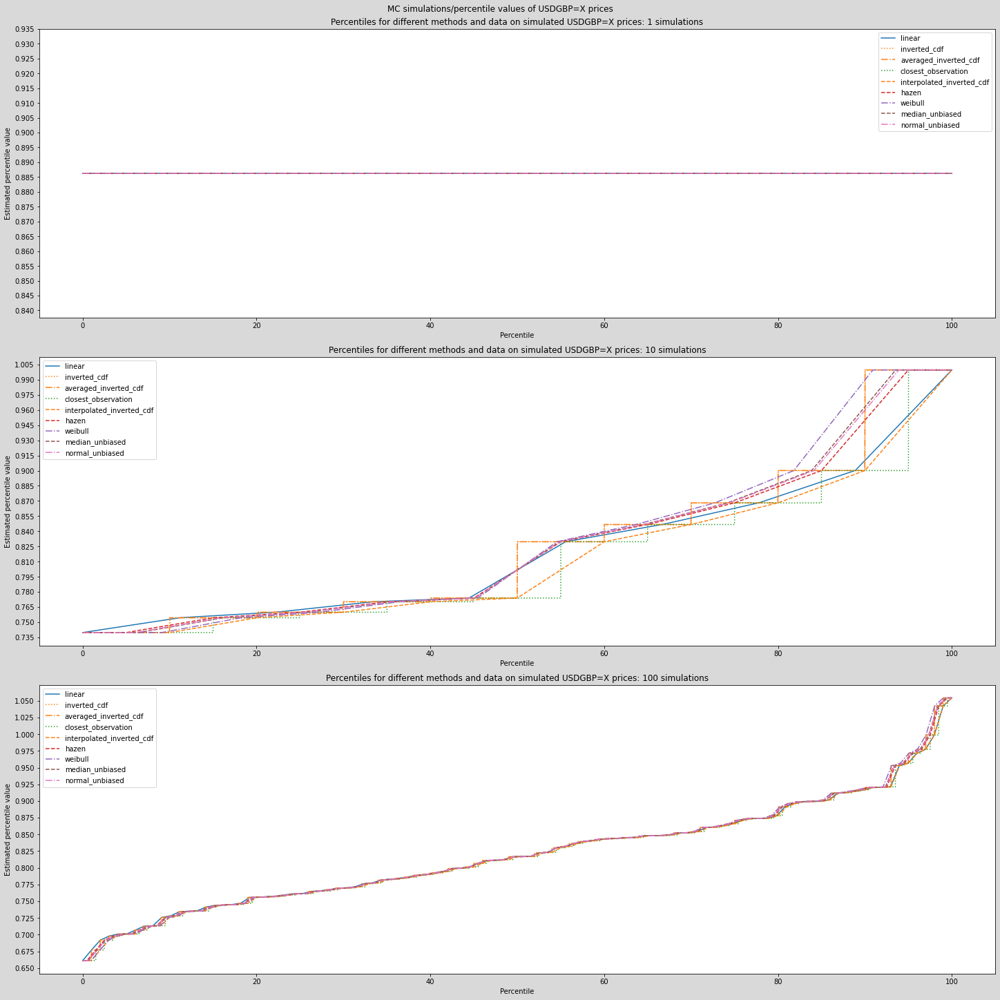

In [ ]:
percentile_plot(sim_output_usdgbp,ticker = ticker)

[*********************100%***********************]  1 of 1 completed
The mean daily returns for EURGBP=X are 4.9574217095770136e-05
The standard deviation of daily returns for EURGBP=X are 0.005537779710125682
Average trading days are 260.4583333333333 therefore use a value of 252 as annual trading days


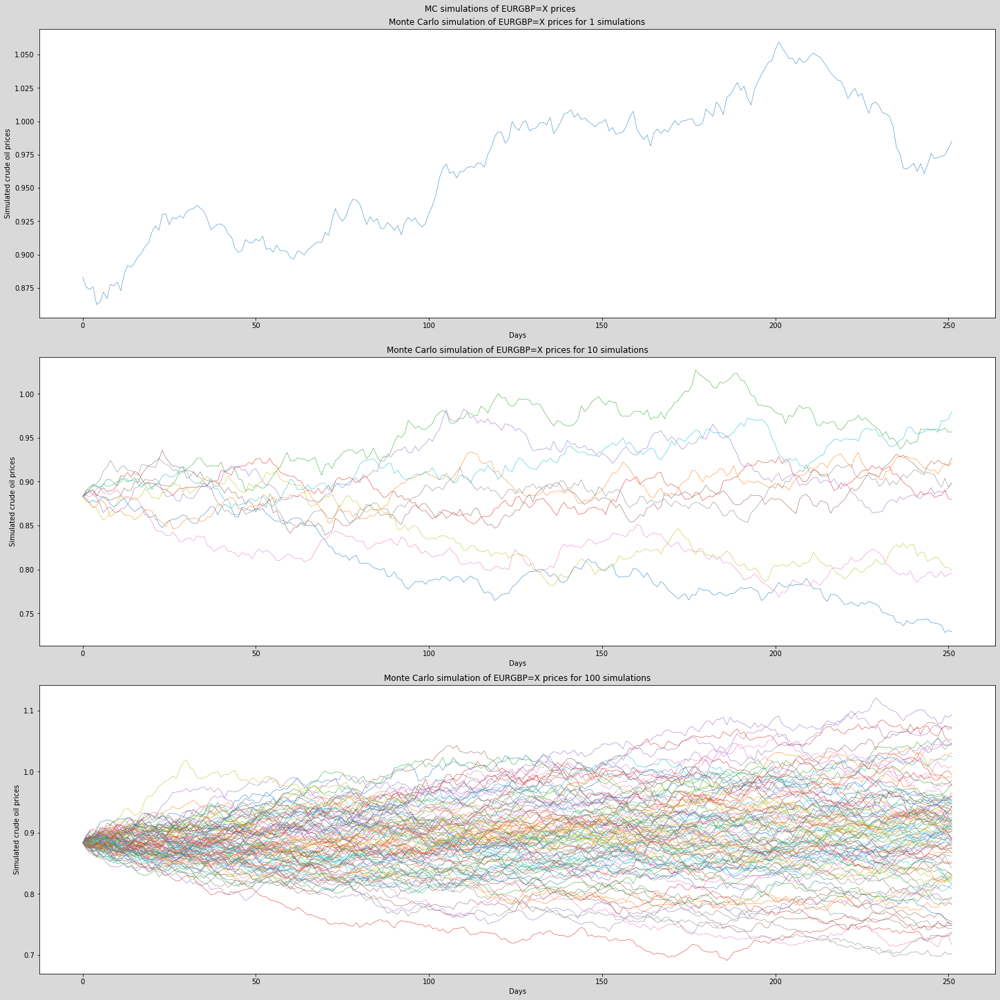

In [ ]:
days_simulated = 252
ticker = "EURGBP=X"
days_diff_from_today = 10000

sim_output_eurgbp = mc_simulations(simulations = array_sims, days_simulated = days_simulated, ticker = ticker, days_diff_from_today = days_diff_from_today)

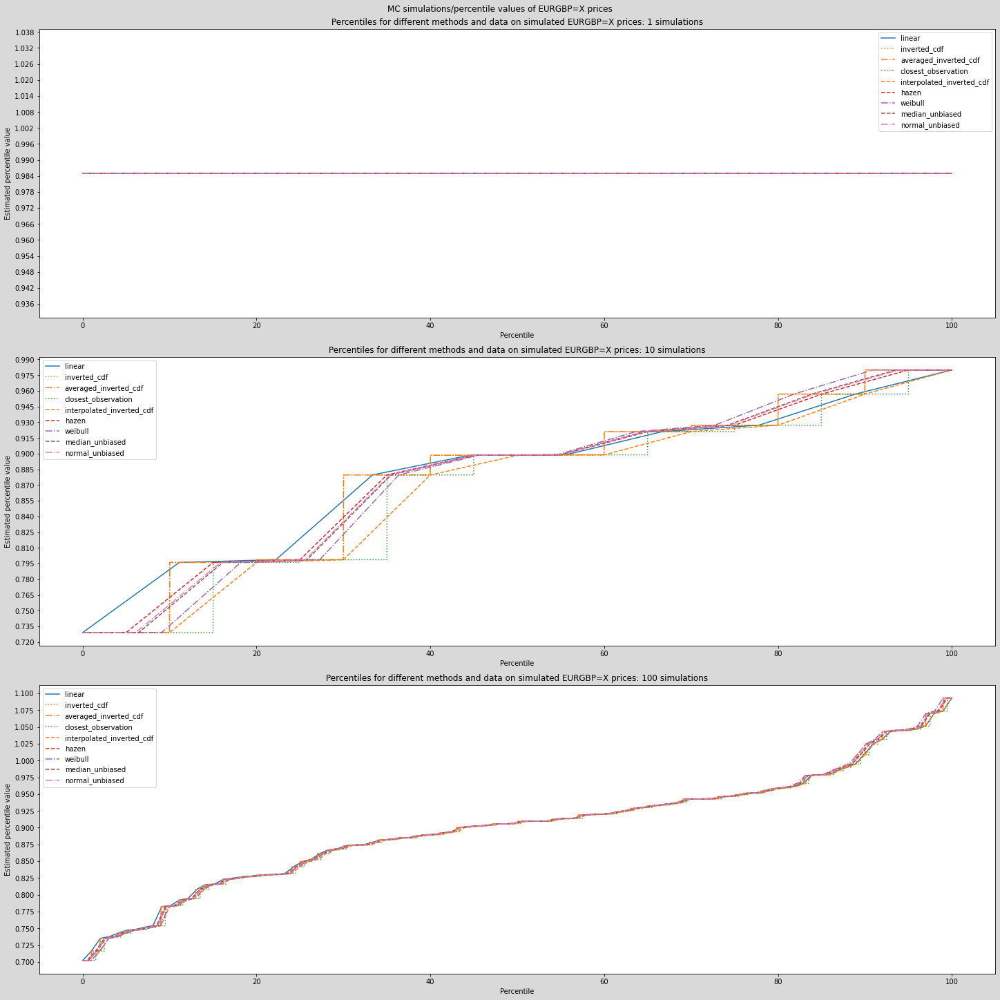

In [ ]:
percentile_plot(sim_output_eurgbp,ticker = ticker)

# Functions for MC simulations: Stocks

In [ ]:
def get_data_stock(ticker_abb, days_diff_from_today):
  '''
  ticker_abb-string, days_diff_from_today-integer inputs
  generate the dataset and plot the trend based on historic data
  hist-dataframe, start_date-string outputs
  '''
  ticker = yf.Ticker(ticker_abb)
  start_date = str(datetime.date.today() - datetime.timedelta(days=10000))
  end_date = str(datetime.date.today())
  hist = ticker.history(start=start_date, end = end_date)
  hist = hist[['Close']]
  hist['Close'].plot(title=f'{ticker_abb} Stock Price', ylabel = 'Closing Price [$]', figsize=[10,8])
  plt.rcParams['figure.facecolor'] = 'black'
  plt.grid()
  return hist, start_date




def original_price(hist_data, ticker_abb):
  '''
  hist_data-dataframe, ticker_abb-string inputs
  estimate the original price and the statistics of the dataset based on the closing price. Additionally, calculate the days associated with the dataset
  price_orig-float, days-integer, mean-float, std_dev-float outputs
  '''
  days = [i for i in range(1, len(hist['Close'])+1)]
  price_orig = hist_data['Close'].tolist()
  change = hist_data['Close'].pct_change().tolist()
  change = change[1:] 

  mean = np.mean(change)
  std_dev = np.std(change)
  print(f'\nMean percent change for {ticker_abb}: ' + str(round(mean*100, 2)) + '%')
  print(f'Standard Deviation of percent change for {ticker_abb}: ' +   
      str(round(std_dev*100, 2)) + '%')
  return price_orig, days, mean, std_dev




def stock_sim_prediction(simulations, hist_data, days_simulated, days, start_date, mean, std_dev):
  '''
  simulations-integer, hist_data-dataframe, days_simulated-integer, days-integer, start_date-string, mean-float, std_dev-float inputs
  plot the original historic price from the dataset and then for a given number of simulations estimate the closing_price and the predicted close_prices above the original ones used in the predictions
  close_end-list, above_close-list outputs
  '''
  fig = plt.figure(figsize=[10, 6], facecolor = 'white')
  plt.plot(days, price_orig)
  plt.title("Monte Carlo Stock Prices [" + str(simulations) + 
          " simulations]")
  plt.xlabel("Trading Days After " + start_date)
  plt.ylabel("Closing Price [$]")
  plt.xlim([6000, len(days)+days_simulated])
  plt.grid()

  close_end = []
  above_close = []

  for i in range(simulations):
    num_days = [days[-1]]
    close_price = [hist.iloc[-1, 0]]

    for j in range(days_simulated):
      num_days.append(num_days[-1]+1)
      perc_change = norm.ppf(random(), loc=mean, scale=std_dev)
      close_price.append(close_price[-1]*(1+perc_change))

    if close_price[-1] > price_orig[-1]:
      above_close.append(1)
    else:
      above_close.append(0)
    close_end.append(close_price[-1])
    plt.plot(num_days, close_price)
  return close_end, above_close




def predict_stock(close_end, price_orig, simulations):
  '''
  close_end-list, price_orig-list, simulations-integer inputs
  estimate the average, predicted closing price after a year of simulated trading based on teh historic data and the probability of the price increasing
  None output
  '''
  average_closing_price = sum(close_end)/simulations
  average_perc_change = (average_closing_price-
                       price_orig[-1])/price_orig[-1]
  probability_of_increase = sum(above_close)/simulations
  print('\nPredicted closing price after ' + str(simulations) + 
      ' simulations: $' + str(round(average_closing_price, 2)))
  print('Predicted percent increase after 1 year: ' + 
      str(round(average_perc_change*100, 2)) + '%')
  print('Probability of stock price increasing after 1 year: ' + 
      str(round(probability_of_increase*100, 2)) + '%')

## Stock price change: simulations

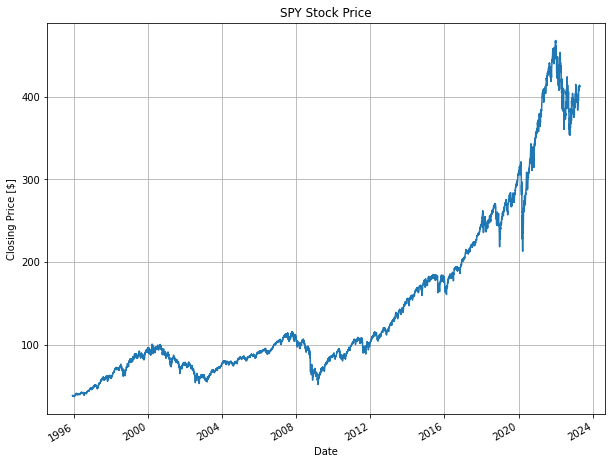

In [ ]:
ticker_abb = 'SPY'
days_diff_from_today = 10000

hist, start_date = get_data_stock(ticker_abb = ticker_abb, days_diff_from_today = days_diff_from_today)

In [ ]:
price_orig, days, mean, std_dev = original_price(hist_data = hist, ticker_abb = ticker_abb)


Mean percent change for SPY: 0.04%
Standard Deviation of percent change for SPY: 1.24%


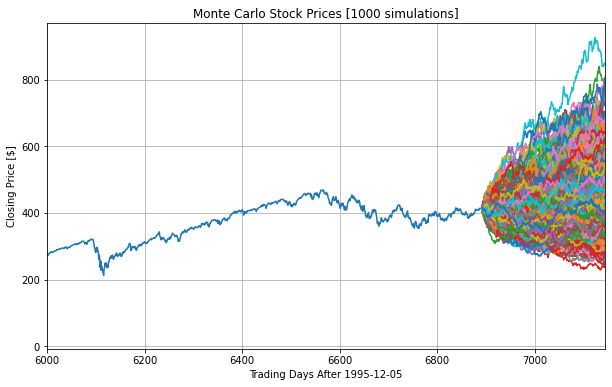

In [ ]:
simulations = 1000
days_simulated = 252

close_end, above_close = stock_sim_prediction(simulations = simulations, hist_data = hist, days_simulated = days_simulated, days = days, start_date = start_date, mean = mean, std_dev = std_dev)

In [ ]:
predict_stock(close_end = close_end, price_orig = price_orig, simulations = simulations)


Predicted closing price after 1000 simulations: $918.06
Predicted percent increase after 1 year: 122.72%
Probability of stock price increasing after 1 year: 135.8%
